In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
from IPython.display import Image as i

In [39]:
df_tweets = pd.read_csv("trump_tweets.csv") 
df_tweets = df_tweets[~df_tweets['text'].str.contains("RT @")]
df_tweets.shape

(12631, 7)

In [3]:
raw_tweets = df_tweets['text'].values.tolist()

In [51]:
#Create a string form of our list of text
raw_string = ''.join(raw_tweets)
no_links = re.sub(r'http\S+', '', raw_string)
no_unicode = re.sub(r"\\[a-z][a-z]?[0-9]+", '', no_links)
no_special_characters = re.sub('[^A-Za-z ]+', '', no_unicode)
words = no_special_characters.split(" ")
words = [w for w in words if len(w) > 3]  # ignore a, an, be, ...
#words = [w.lower() for w in words]
words = [w for w in words if w not in STOPWORDS]

In [52]:
mask = np.array(Image.open('/Users/ashra/Downloads/Twitter_Logo.png'))

In [53]:
wc = WordCloud(background_color="white", max_words=500, mask=mask)
clean_string = ','.join(words)
wc.generate(clean_string)

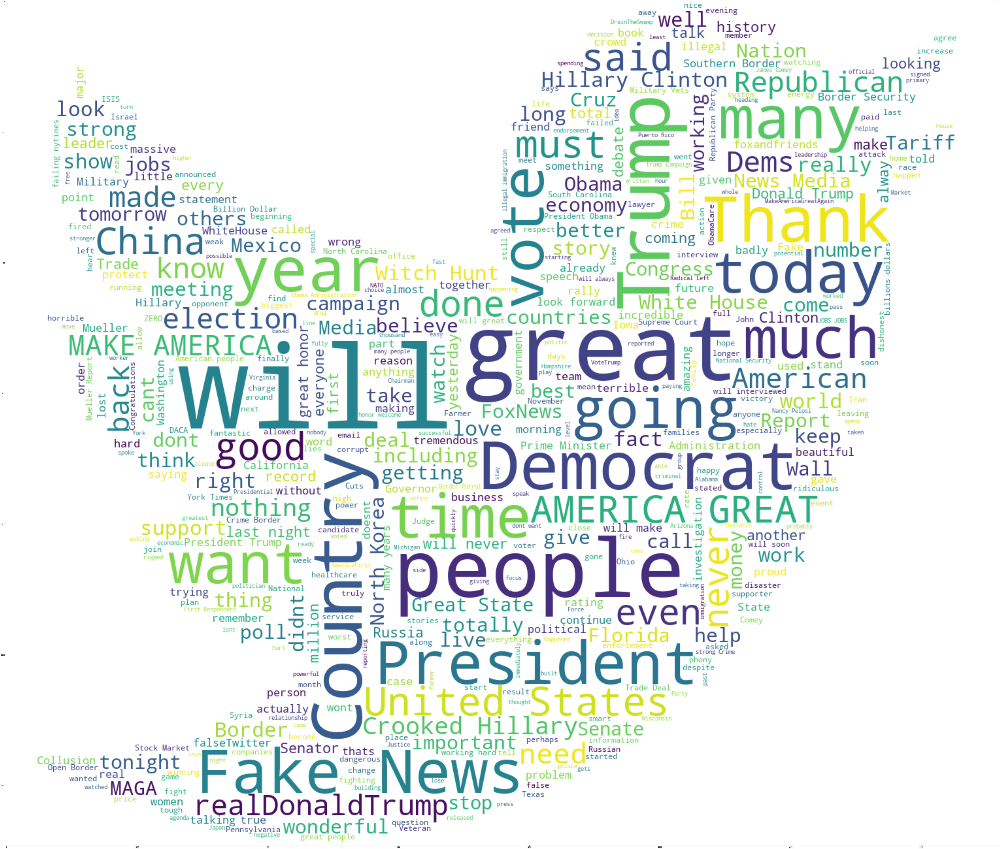

In [56]:
f = plt.figure(figsize=(250,250))
f.add_subplot(1,2, 2)
plt.imshow(wc, interpolation='bilinear')
#plt.title('Twitter Generated Cloud', size=40)
#plt.axis("off")
plt.show()
wc.to_file("/Users/ashra/Downloads/WordCloud.png")